# UGCA_Assignment_3

#### Anuja Srivastava, Pankaj Kishore, Jitender Phogat, Karthik Kandakumar

Which food you searched for and the total number of reviews scraped!- Mexican & Austin

High level description: The objective of this group assignment is to create the building blocks of a crowdsourced recommendation system. This recommendation system should accept user inputs about desired attributes of a restaurant and come up with 3 recommendations. 

## Task A

Either use Web Scraper (free extension for Chrome, http://webscraper.io/) or write your own scraper to extract 3-4k reviews of restaurants from Yelp. On Yelp.com, specify the location – e.g., Austin downtown, and type of food (e.g., Chinese or Mexican food). Scrape the text reviews and well as the ratings (the number of stars) provided by the users (there is no need to scrape pictures of food and other details). Your data file should have 3 columns – the name of the restaurant, reviews, and ratings. 

In [65]:
## Extracted data using webscrapper plugin, now importing the csv here

In [3]:
import numpy as np
import pandas as pd

In [67]:

data_raw = pd.read_csv('yelpmex2.csv')
print(data_raw.shape)

(6735, 10)


In [68]:
data_raw.head()

,web-scraper-order,web-scraper-start-url,restaurant_links,restaurant_links-href,review_text,ratings,review_pages,review_pages-href,restaurant_link_pages,restaurant_link_pages-href
0,1540912173-2825,https://www.yelp.com/search?find_desc=Mexican+...,La Traila at Mesa,https://www.yelp.com/biz/la-traila-at-mesa-aus...,Oh my goodness. All I can say is wow. Great de...,"<img class=""offscreen"" height=""303"" src=""https...",NaN,NaN,8,https://www.yelp.com/search?find_desc=Mexican%...
1,1540912243-3122,https://www.yelp.com/search?find_desc=Mexican+...,Serranos,https://www.yelp.com/biz/serranos-austin-5?osq...,"Great Prices good Food.\n\nThat being said, so...","<img class=""offscreen"" height=""303"" src=""https...",4.0,https://www.yelp.com/biz/serranos-austin-5?osq...,8,https://www.yelp.com/search?find_desc=Mexican%...
2,1540911990-2090,https://www.yelp.com/search?find_desc=Mexican+...,Fruteria Pekitas,https://www.yelp.com/biz/fruteria-pekitas-aust...,The fruit here is good and fresh with many gre...,"<img class=""offscreen"" height=""303"" src=""https...",NaN,NaN,9,https://www.yelp.com/search?find_desc=Mexican%...
3,1540912107-2555,https://www.yelp.com/search?find_desc=Mexican+...,Tacos El Rincon,https://www.yelp.com/biz/tacos-el-rincon-austi...,Hey this in in el ricon restaurant in Austin p...,"<img class=""offscreen"" height=""303"" src=""https...",NaN,NaN,8,https://www.yelp.com/search?find_desc=Mexican%...
4,1540911866-1624,https://www.yelp.com/search?find_desc=Mexican+...,Zuzu Handmade Mexican Food,https://www.yelp.com/biz/zuzu-handmade-mexican...,To start with all the tables were dirty. I wip...,"<img class=""offscreen"" height=""303"" src=""https...",2.0,https://www.yelp.com/biz/zuzu-handmade-mexican...,9,https://www.yelp.com/search?find_desc=Mexican%...


In [69]:
##keeping only 3 required columns
list(data_raw.columns.values)   #This actually lists all the columns


['web-scraper-order',
 'web-scraper-start-url',
 'restaurant_links',
 'restaurant_links-href',
 'review_text',
 'ratings',
 'review_pages',
 'review_pages-href',
 'restaurant_link_pages',
 'restaurant_link_pages-href']

In [70]:
#data_new=data_raw.drop(columns=['web-scraper-order','web-scraper-start-url','restaurant_links-href','review_pages','review_pages-href','restaurant_pages','restaurant_pages-href'],axis=1)

data_new=data_raw.drop(columns=['web-scraper-order','web-scraper-start-url','restaurant_links-href','review_pages','review_pages-href','restaurant_link_pages','restaurant_link_pages-href'],axis=1)



In [71]:
data_new['review_text'] =data_new['review_text'].str.lower()

In [72]:
data_new.head(10)

,restaurant_links,review_text,ratings
0,La Traila at Mesa,oh my goodness. all i can say is wow. great de...,"<img class=""offscreen"" height=""303"" src=""https..."
1,Serranos,"great prices good food.\n\nthat being said, so...","<img class=""offscreen"" height=""303"" src=""https..."
2,Fruteria Pekitas,the fruit here is good and fresh with many gre...,"<img class=""offscreen"" height=""303"" src=""https..."
3,Tacos El Rincon,hey this in in el ricon restaurant in austin p...,"<img class=""offscreen"" height=""303"" src=""https..."
4,Zuzu Handmade Mexican Food,to start with all the tables were dirty. i wip...,"<img class=""offscreen"" height=""303"" src=""https..."
5,Los Comales Mexican Restaurant,if you order from there lunch menu you can't g...,"<img class=""offscreen"" height=""303"" src=""https..."
6,Tacodeli,sorry not good... i ordered two tacos which to...,"<img class=""offscreen"" height=""303"" src=""https..."
7,Taqueria Morales,best tacos we have ever had! actually think it...,"<img class=""offscreen"" height=""303"" src=""https..."
8,Manuels,the only thing i can think is that people are ...,"<img class=""offscreen"" height=""303"" src=""https..."
9,Serranos,still a great deal for having happy hour. grea...,"<img class=""offscreen"" height=""303"" src=""https..."


In [73]:
import nltk
import re

rating_list=[]

text_list = data_new["ratings"].tolist()
for x in text_list:
    pattern = "alt=\"(.*?) star rating\">"
    temp = re.findall(pattern, x)
    rating_list.append(temp[0])


In [74]:
len(rating_list)

6735

In [75]:
data_new['Ratings'] = pd.Series(rating_list).values
data_new.head()

,restaurant_links,review_text,ratings,Ratings
0,La Traila at Mesa,oh my goodness. all i can say is wow. great de...,"<img class=""offscreen"" height=""303"" src=""https...",5.0
1,Serranos,"great prices good food.\n\nthat being said, so...","<img class=""offscreen"" height=""303"" src=""https...",4.0
2,Fruteria Pekitas,the fruit here is good and fresh with many gre...,"<img class=""offscreen"" height=""303"" src=""https...",4.0
3,Tacos El Rincon,hey this in in el ricon restaurant in austin p...,"<img class=""offscreen"" height=""303"" src=""https...",5.0
4,Zuzu Handmade Mexican Food,to start with all the tables were dirty. i wip...,"<img class=""offscreen"" height=""303"" src=""https...",1.0


In [76]:
df_final = data_new.drop(columns=['ratings'],axis=1)
df_final.head(20)

,restaurant_links,review_text,Ratings
0,La Traila at Mesa,oh my goodness. all i can say is wow. great de...,5.0
1,Serranos,"great prices good food.\n\nthat being said, so...",4.0
2,Fruteria Pekitas,the fruit here is good and fresh with many gre...,4.0
3,Tacos El Rincon,hey this in in el ricon restaurant in austin p...,5.0
4,Zuzu Handmade Mexican Food,to start with all the tables were dirty. i wip...,1.0
5,Los Comales Mexican Restaurant,if you order from there lunch menu you can't g...,1.0
6,Tacodeli,sorry not good... i ordered two tacos which to...,1.0
7,Taqueria Morales,best tacos we have ever had! actually think it...,5.0
8,Manuels,the only thing i can think is that people are ...,1.0
9,Serranos,still a great deal for having happy hour. grea...,5.0


In [77]:
df_final.to_csv('final_reviews.csv', sep=',',encoding='utf-8')

## Summary till this point:

Till this point the requirement was to create the .csv file which contained three columns namely: 
* Restaurant Names, Revies and ratings

We used web scrapper- free extention from Chrome to scrape the website. To give a detailed explanation of how we scraped the website, sitemap is shown in the next cell.

In order to get the data in current form, few preprocessing steps were required-
* Since the ratings were in html form, we converted it to bare ratings by removing punctuations and extra texts. 


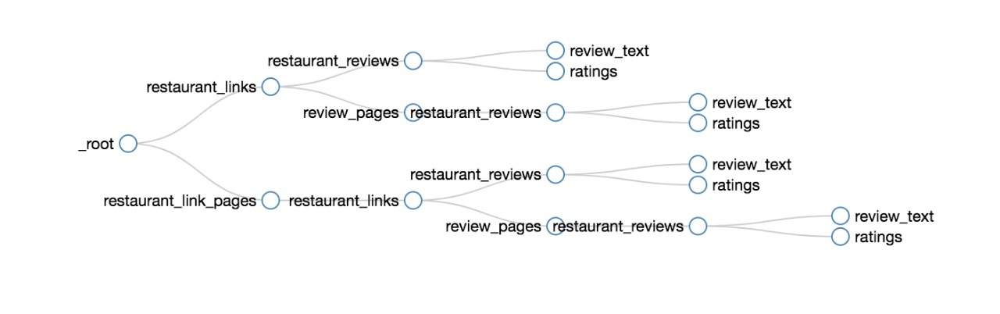

In [78]:
from IPython.display import Image
Image(filename='Sitemap.jpeg')

## Task B

Assume that a customer who will be using this recommendation system has specified 4 desirable attributes in a restaurant s/he is looking for – (i) service (e.g., speed, friendliness, etc.), (ii) food (e.g., quality, taste, etc.), (iii) price and (iv) location (e.g., parking, easy to find, drive through, etc.). 

#### Initial Steps

In [79]:
import nltk
from nltk.tokenize import sent_tokenize

#remove punctuations
df_final['review_text'] = df_final['review_text'].str.replace(r'[^\w\s]+', '')
df_final.head()



,restaurant_links,review_text,Ratings
0,La Traila at Mesa,oh my goodness all i can say is wow great dept...,5.0
1,Serranos,great prices good food\n\nthat being said some...,4.0
2,Fruteria Pekitas,the fruit here is good and fresh with many gre...,4.0
3,Tacos El Rincon,hey this in in el ricon restaurant in austin p...,5.0
4,Zuzu Handmade Mexican Food,to start with all the tables were dirty i wipe...,1.0


In [80]:
#convert it to lower
text_list = df_final['review_text'].tolist()
text_lower = [element.lower() for element in text_list]
text_lower

['oh my goodness all i can say is wow great depth of flavor we wanted to come to a taco truck and la traila delivered the pastor was bomb and the sauce while spicy was super delicious we definitely will be coming back as the prices are super reasonable thanks la traila',
 'great prices good food\n\nthat being said someone randomly called me from a chilis off of foursquare and they put me in contact with themit was a weird experience but its weird to be called at a restaurant\n\nthe salsa is good when its not too peppery \xa0but mostly i like this place because its always fast and you can get really good lunch specials \xa0i share the lunch special with my wife sometimes and it ends up costing us like 7',
 'the fruit here is good and fresh with many great combinations \xa0its allot like pepes\n\nive also gotten the pastor burrito which is good tasty and huge and for 6 its a great deal \xa0the other food items are mostly too pricey though \xa0a taco plate out of a place like this should 

In [81]:
import nltk
from nltk.tokenize import sent_tokenize

text_list = df_final['review_text'].tolist()
for text in text_lower:
    sent_tokenize_list = sent_tokenize(text)
    print(sent_tokenize_list)

['oh my goodness all i can say is wow great depth of flavor we wanted to come to a taco truck and la traila delivered the pastor was bomb and the sauce while spicy was super delicious we definitely will be coming back as the prices are super reasonable thanks la traila']
['great prices good food\n\nthat being said someone randomly called me from a chilis off of foursquare and they put me in contact with themit was a weird experience but its weird to be called at a restaurant\n\nthe salsa is good when its not too peppery \xa0but mostly i like this place because its always fast and you can get really good lunch specials \xa0i share the lunch special with my wife sometimes and it ends up costing us like 7']
['the fruit here is good and fresh with many great combinations \xa0its allot like pepes\n\nive also gotten the pastor burrito which is good tasty and huge and for 6 its a great deal \xa0the other food items are mostly too pricey though \xa0a taco plate out of a place like this should 

['cheap drinks here i had a traditional margarita it was 3 really good the bartender made a random mixed drink for us which was delicious def coming back here']
['i had so been looking forward to trying tacodeli \xa0id been raving about my surprisingly delicious whatataco breakfast taco experience and everyone assured me wait until you try tacodeli \xa0\n\nbut i was tragically disappointed \xa0the bacon in my otto was undercooked and slippery \xa0the lettuce in my heather was wet and made the whole taco watery \xa0the queso is subpar and uninspired too\n\nthis place doesnt compare to torchys on any level where the tacos and the queso are in a different league and the breakfast tacos at whatattaco are much better\n\nthe dona sauce however is totally delicious \xa0i looked up a recipe online  its very simple just 3 ingredients so i cant wait to make it at home \xa0the dona sauce is really the only reason to come here']
['good things  the breakfast items are good \xa0the enchiladas are go

['delicious\n\nwe went to grannys tacos for breakfast and ended up ordering nearly the entire menu \n\nmust gets\n haley bowl absolutely delicious and hearty yet so healthy\n bacon egg cheese breakfast taco you cant go wrong with this one highly recommend trying with some of the sauces adds a little heat\n ranchero taco\n\neveryone who works there is so so nice the lady supposedly makes homemade corn tortillas too to try next time']
['its very ok we excused a lot for being local owned and fresh we did not like the thick tortilla soup at allwe do like the corn tortilla tacos']
['having tried a decent bit of bbq all around austin i think i can safely say that this place has the best for which you dont need to wait forever\n\nthis may be a silly distinction to make but talking with friends and coworkers about places like franklins la bbq and salt lick when youre already hungry is pretty frustrating since we agree they are very good but they require at least a small amount of planning ahea

['i dined here sunday afternoon with my usual crewmy sisterinlaw and my two boys \xa0it was really crowded but that did not hurt the service we received at all \xa0our server was very attentive and we never lacked for beverages or anything else \xa0i had a bowl of tortilla soup and it was gigantic \xa0i didnt get close to finishing it but not because it wasnt good \xa0the broth was very tasty and there was just the right amount of vegetables shredded chicken tortilla strips and cheese \xa0 no tortilla soup is complete without adding rice \xa0the rice here was much more of the traditional spanish rice tinged with tomato \xa0than i am used to but it was good and balanced well in the soup \xa0\n\nnot this far south too often anymore but i will tuck this location into my mental rolodex']
['honestly not my favorite tex mex i dont know if it was the cheese or the sauces on my plate that didnt flow well together my husbands burrito just had an explosion of smashed beans more than anything he 

['i dont post in yelp very often my experience at this restaurant however has led me to let everyone possible know that it was a wonderful experience \nfood fresh\nservice exemplary \ndrinks goooood\nour waiter a manager on duty and one of the owners came to check on us no less than five times during our visit the food was brought out to a speedily after we ordered this was my first time at jalapenos and i was very impressed well be recommending this to all my friends and family \ncome to jalapenos taqueria  bar if you want to be taken care of']
['good was delicious as usual the staff is always awesome but monika was a cut above the rest she immediately recognized that i might have a food allergy based on two side requests i made\nshe was attentive and accommodating she even had the guys in the back make me pico without cilantro even though i didnt ask that kind of attention to detail is simply superb']
['excellent food drinks and atmosphere \xa0the prickly pear margarita guacamole que

['we came here for the penny refill mimosas and i wont be making any reviews on that event since it is separate from their restaurant \n\ncoming in the server gave us drinks and water really really late  the food came out at the same time as our drinks i think they mightve ran out of cups at the restaurant but i think the least our server could have done was let us know ahead of time since a few of us were hungry but again it was really busy so i understand \n\nchips and salsa wasnt refilled at all but again  it was really busy so i also dont mind that too much \n\nnow the food itself i ordered the bowl of the tortilla soup holy cow it was bigger than my face and probably could feed my great great great daughter who doesnt even exist it gave me an extreme food coma and sent me right up to sleepysnooze texas the soup itself was pretty okay  nothing i would have jumped out of my chair about but the portions are huuuuuge its my breakfast lunch and dinner it epitomizes texmex everything is

['sorry wish i was allowed to give zero stars\n\nwent here on a sunday evening early evening place was half full but we were told that there was a 20  minute wait we found two seats at the bar so we sat there i ordered a beer from the menu they did not have it any more i ordered a diff beer the keg blew and bartender who was running around like he was on fire did not have time to change it\n\nremember sunday early evening half full\n\ni order a third beer option they have it \xa0my gf orders a drink she orders her food i order mine my choice is not even being served any more but it is still on the menu we get some chips that have a layer of good ones on a mountain of crumbles \n\nmeanwhile the bartender is still running to keep up w all he has to do the hostess is also running around taking care of things\n\nmy gf goes to the womens bathroom dirty and the one stalls toilet is full to the top with toilet paper she goes to the mens bathroom dirty thats as big as a phone booth when she le

['this is the best mexican restaurant in town my girlfriend and i are regulars and whenever we bring friends they love it too\nthe waitresses may seem a bit short at first but once you go a few times they always remember you and are super friendly\nthe best margaritas in austincheap too best tortillas tacos everything\nthis is a wonderful place that i highly suggest enjoy']
['this might be some of the best tacos in town at least from a trailer i know that might sound crazy but wow they are so simple and tasty just onions and cilantro on perfectly flavored meat the salsa is damn good too the steak taco is my personal favorite and i am not even that much of a red meat eater i also just tried a chicken quesadilla and it was awesome its so unassuming just some little family run trailer but its fresh and delicious  and cheap i think i could eat here every day']
['its just so dang good i dont really have anything else to say \xa0they have very good tacos']
['this food truck makes the best al

['it took a while for the bartender to acknowledge us he didnt even offer to wipe the bar top until we asked we had to ask twice for food menus as opposed to just drink menus the food was okay \xa0the margaritas were good but over priced like i know its the domain but 10 for a small house margarita is nuts']
['awesome\nate here for the first time and i have to say that im very impressed homemade sides are collared greens pinto beans mac n cheese']
['i went here as a second choice because trudys was too full and it served the purpose i sat at the bar and had the cantarita which was fantasticthe enchiladas and taco were typical i also had the queso which i do not recommend its regular yellow cheese melted for 599not worth it at all i saw someone getting the guacamole made tableside and wished i had gotten that']
['i was headed to a taco truck that someone recommended when i noticed gringas glad i chose to stop in tacos were solid i had the pastor street tacos and the flankin me crazy tac

In [82]:
#word tokenizer

from nltk.tokenize import word_tokenize
for text in text_lower:
     work_tokenize_list=word_tokenize(text)
     print(work_tokenize_list)

['oh', 'my', 'goodness', 'all', 'i', 'can', 'say', 'is', 'wow', 'great', 'depth', 'of', 'flavor', 'we', 'wanted', 'to', 'come', 'to', 'a', 'taco', 'truck', 'and', 'la', 'traila', 'delivered', 'the', 'pastor', 'was', 'bomb', 'and', 'the', 'sauce', 'while', 'spicy', 'was', 'super', 'delicious', 'we', 'definitely', 'will', 'be', 'coming', 'back', 'as', 'the', 'prices', 'are', 'super', 'reasonable', 'thanks', 'la', 'traila']
['great', 'prices', 'good', 'food', 'that', 'being', 'said', 'someone', 'randomly', 'called', 'me', 'from', 'a', 'chilis', 'off', 'of', 'foursquare', 'and', 'they', 'put', 'me', 'in', 'contact', 'with', 'themit', 'was', 'a', 'weird', 'experience', 'but', 'its', 'weird', 'to', 'be', 'called', 'at', 'a', 'restaurant', 'the', 'salsa', 'is', 'good', 'when', 'its', 'not', 'too', 'peppery', 'but', 'mostly', 'i', 'like', 'this', 'place', 'because', 'its', 'always', 'fast', 'and', 'you', 'can', 'get', 'really', 'good', 'lunch', 'specials', 'i', 'share', 'the', 'lunch', 'specia

['i', 'am', 'not', 'one', 'to', 'frequent', 'dirty', '6th', 'as', 'a', 'matter', 'of', 'fact', 'i', 'tend', 'to', 'avoid', 'it', 'like', 'the', 'plague', 'of', 'fratsorority', '20something', 'atx', 'tourist', 'infestation', 'that', 'it', 'is', 'that', 'being', 'said', 'like', 'any', 'austinite', 'who', 'has', 'lived', 'here', 'more', 'than', 'the', 'month', 'unlike', 'most', 'of', 'the', 'people', 'you', 'find', 'on', 'd6', 'every', 'now', 'and', 'again', 'i', 'have', 'to', 'serve', 'my', 'semiannual', 'penance', 'and', 'go', 'to', 'd6', 'for', 'some', 'event', 'or', 'friends', 'birthday', 'or', 'to', 'show', 'a', 'visiting', 'friendrelativeperspective', 'airbnb', 'client', 'what', 'to', 'avoid', 'after', 'their', 'first', 'time', 'here', 'i', 'just', 'so', 'happen', 'to', 'be', 'in', 'the', 'vicinity', 'for', 'a', 'special', 'event', 'this', 'saturday', 'night', 'i', 'also', 'usually', 'loathe', 'the', 'parking', 'sitch', 'on', 'd6', 'because', 'of', 'the', 'lack', 'thereof', 'on', 't

['i', 'went', 'to', 'manuels', 'to', 'meet', 'up', 'with', 'some', 'friends', 'it', 'was', 'much', 'nicer', 'inside', 'that', 'i', 'anticipated', 'the', 'service', 'was', 'good', 'the', 'problem', 'with', 'manuels', 'is', 'the', 'price', 'is', 'too', 'high', 'for', 'the', 'quality', 'and', 'quantity', 'of', 'food', 'that', 'you', 'receive', 'their', 'house', 'margarita', 'is', 'is', 'mostly', 'ice', 'and', 'just', 'tastes', 'like', 'water', 'i', 'had', 'the', 'chicken', 'flautas', 'which', 'tasted', 'good', 'but', 'again', 'far', 'too', 'expensive', 'for', 'the', 'quantity', 'if', 'you', 'want', 'to', 'have', 'some', 'good', 'quality', 'mexican', 'food', 'this', 'is', 'not', 'the', 'place', 'for', 'you', 'if', 'you', 'like', 'paying', 'too', 'much', 'for', 'average', 'food', 'thats', 'plated', 'well', 'go', 'for', 'it']
['awesome', 'take', 'on', 'two', 'awesome', 'cuisines', 'the', 'dragon', 'balls', 'were', 'as', 'good', 'as', 'they', 'sounded', 'and', 'the', 'service', 'was', 'excell

['do', 'not', 'use', 'your', 'bank', 'card', 'here', 'i', 'dined', 'for', 'lunch', 'after', 'church', 'yesterday', 'and', 'left', 'a', 'cash', 'tip', 'thus', 'reflecting', 'the', '000', 'tip', 'on', 'the', 'receipt', 'my', 'waitress', 'ran', 'my', 'card', 'for', 'double', 'the', 'amount', 'whats', 'interesting', 'is', 'both', 'managers', 'defended', 'this', 'incident', 'as', 'an', 'accident', 'nevertheless', 'this', 'is', 'the', 'second', 'time', 'this', 'has', 'happened', 'to', 'me', 'at', 'this', 'establishment', 'so', 'needless', 'to', 'say', 'i', 'will', 'not', 'be', 'returning', 'it', 'doesnt', 'help', 'that', 'the', 'food', 'is', 'terrible', 'the', 'chips', 'are', 'bland', 'and', 'the', 'chicken', 'was', 'undercooked', '5', 'thumbs', 'down']
['amazing', 'some', 'of', 'the', 'best', 'texmex', 'in', 'austin', 'i', 'love', 'this', 'place', 'so', 'much', 'i', 'used', 'to', 'go', 'to', 'the', 'location', 'by', 'lakeline', 'mall', 'when', 'i', 'lived', 'up', 'north', 'but', 'now', 'i',

['i', 'used', 'to', 'eat', 'here', 'regularly', 'it', 'has', 'always', 'been', 'good', 'and', 'consistent', 'as', 'far', 'as', 'taste', 'and', 'quality', 'over', 'the', 'past', 'year', 'there', 'has', 'been', 'a', 'decline', 'in', 'the', 'atmosphere', 'and', 'patronage', 'last', 'night', 'was', 'no', 'exception', 'there', 'were', '6', 'tables', 'all', 'lined', 'up', 'in', 'the', 'entire', 'restaurant', 'it', 'was', 'uncomfortably', 'quiet', 'all', '3', 'servers', 'and', 'manager', 'had', 'no', 'make', 'up', 'on', 'neither', 'did', 'i', 'and', 'looked', 'as', 'if', 'they', 'just', 'woke', 'up', 'food', 'quality', 'was', 'below', 'par', 'our', 'enchiladas', 'were', 'hot', 'on', 'outside', 'but', 'cheese', 'was', 'not', 'melted', 'on', 'inside', 'at', 'all', 'taco', 'had', 'very', 'small', 'amount', 'of', 'cheese', 'on', 'the', 'plate', 'and', 'queso', 'was', 'not', 'completely', 'melted', 'and', 'formed', 'a', 'skin', 'the', 'display', 'at', 'the', 'register', 'had', 'no', 'candy', 'as',

['how', 'is', 'this', 'place', 'getting', 'good', 'reviews', 'i', 'have', 'been', 'there', 'three', 'times', 'and', 'had', 'crappy', 'service', 'and', 'even', 'worse', 'food', 'each', 'time', 'i', 'figured', 'over', 'a', 'span', 'of', '4', 'years', 'i', 'would', 'have', 'one', 'good', 'experience', 'but', 'no', 'i', 'swore', 'i', 'would', 'never', 'go', 'back', 'after', 'the', 'last', 'bad', 'experience', 'but', 'the', 'place', 'was', 'chosen', 'by', 'relatives', 'i', 'ordered', 'macadamia', 'crusted', 'mahi', 'mahi', 'we', 'had', '6', 'other', 'people', 'including', 'kids', 'and', 'everyone', 'received', 'their', 'meals', 'within', 'a', 'speedy', '30', 'minutes', 'mine', 'didnt', 'come', 'with', 'everyone', 'elses', 'but', 'someone', 'elses', 'chicken', 'did', 'after', '3', 'different', 'people', 'asked', 'me', 'what', 'i', 'ordered', 'mine', 'came', 'after', 'everyone', 'finished', 'their', 'meals', 'and', 'lo', 'and', 'behold', 'when', 'i', 'had', 'finally', 'given', 'up', 'and', 'w

['holy', 'moly', 'i', 'will', 'never', 'ever', 'go', 'here', 'again', 'the', 'owner', 'is', 'not', 'smart', 'about', 'customer', 'service', 'at', 'all', 'arguing', 'with', 'the', 'only', 'customers', 'in', 'your', 'restaurant', 'is', 'not', 'a', 'very', 'smart', 'idea', 'had', 'an', 'issue', 'with', 'happy', 'hour', 'ritas', 'that', 'he', 'was', 'absolutely', 'refused', 'to', 'fix', 'and', 'wanted', 'me', 'to', 'pay', 'for', 'extra', 'tortillas', 'that', 'the', 'waitress', 'rang', 'in', 'in', 'the', 'first', 'place', 'horrible', 'customer', 'service', 'actually', 'none', 'argumentative', 'talking', 'over', 'me', 'not', 'listening', 'to', 'me', 'or', 'my', 'husband', 'and', 'refusing', 'to', 'take', 'off', 'the', 'bill', 'for', 'the', 'errors', 'never', 'going', 'back', 'the', '2', 'stars', 'are', 'for', 'the', 'food', 'and', 'service', 'negative', 'stars', 'for', 'the', 'owner', 'yuck']
['homemade', 'corn', 'credible', 'machacadonice', 'potatoes', 'will', 'have', 'to', 'go', 'back', 'a

['in', 'a', 'town', 'like', 'austin', 'where', 'great', 'mexican', 'food', 'abounds', 'why', 'would', 'you', 'eat', 'at', 'a', 'place', 'like', 'angies', 'i', 'have', 'a', 'boss', 'who', 'loves', 'the', 'place', 'what', 'is', 'your', 'excuse', 'it', 'is', 'an', 'ok', 'runofthemill', 'texmex', 'place', 'the', 'food', 'is', 'not', 'terrible', 'it', 'is', 'not', 'even', 'bad', 'it', 'is', 'a', 'reliable', 'some', 'meat', 'wrapped', 'in', 'tortillas', 'covered', 'with', 'melted', 'cheese', 'with', 'rice', 'and', 'refried', 'beans', 'on', 'the', 'side', 'kind', 'of', 'place', 'their', 'salsas', 'are', 'good', 'you', 'can', 'console', 'yourself', 'with', 'their', 'salsa', 'angie', 'herself', 'is', 'a', 'legendary', 'crank', 'you', 'irritate', 'her', 'dont', 'take', 'it', 'personally', 'everyone', 'irritates', 'her', 'she', 'will', 'not', 'single', 'you', 'out', 'for', 'kindness', 'if', 'youre', 'a', 'regular', 'and', 'you', 'tip', 'well', 'it', 'might', 'be', 'worth', 'going', 'to', 'lunch',

['this', 'taco', 'truck', 'was', 'out', 'of', 'this', 'world', 'loved', 'it', 'the', 'carne', 'guisada', 'was', 'particularly', 'delicious', 'also', 'their', 'salsas', 'are', 'so', 'good', 'just', 'the', 'right', 'amount', 'of', 'spice', 'in', 'the', 'red', 'and', 'green', 'ones', 'ill', 'be', 'back', 'again', 'soon', 'for', 'sure']
['my', 'co', 'worker', 'and', 'i', 'came', 'here', 'for', 'our', 'lunch', 'break', 'got', 'a', 'amazing', 'waiter', 'name', 'gus', 'gus', 'was', 'hands', 'down', 'best', 'waiter', 'very', 'kind', 'and', 'helpful', 'he', 'was', 'extremely', 'descriptive', 'with', 'the', 'menu', 'which', 'encouraged', 'us', 'to', 'try', 'something', 'new', 'he', 'was', 'on', 'top', 'of', 'our', 'refills', 'and', 'constantly', 'asked', 'if', 'we', 'needed', 'anything', 'such', 'a', 'friendly', 'waiter', 'and', 'amazing', 'personality', 'we', 'recommend', 'cyclone', 'anayas', 'to', 'all', 'of', 'our', 'co', 'workers', 'and', 'we', 'recommend', 'gus', 'as', 'their', 'server', 'l

['coworker', 'brought', 'in', 'breakfast', 'tacos', 'they', 'were', 'so', 'good', 'went', 'back', 'for', 'lunch', 'we', 'both', 'got', 'the', 'carnitas', 'and', 'carne', 'asada', 'tacos', 'on', 'homemade', 'corn', 'tortillasshe', 'then', 'asked', 'if', 'we', 'wanted', 'fresh', 'avocado', 'on', 'themyes', 'please', '2', 'tacos', 'what', 'a', 'deal', 'highly', 'recommend', 'this', 'tiny', 'food', 'truck']
['ive', 'heard', 'about', 'this', 'place', 'for', 'years', 'so', 'i', 'was', 'excited', 'to', 'finally', 'get', 'to', 'one', 'and', 'try', 'these', 'famous', 'tacos', 'that', 'word', 'of', 'mouth', 'is', 'certainly', 'represented', 'in', 'the', 'lines', 'its', 'a', 'popular', 'place', 'around', 'lunch', 'time', 'it', 'took', 'maybe', 'ten', 'minutes', 'to', 'work', 'our', 'way', 'up', 'through', 'the', 'line', 'not', 'too', 'bad', 'given', 'the', 'crowd', 'we', 'ordered', 'chips', 'guacamole', 'and', 'queso', 'for', 'the', 'table', 'and', 'i', 'ordered', 'both', 'the', 'democrat', 'and'

['great', 'servicewith', 'smiling', 'faces', 'i', 'personally', 'love', 'the', 'bfast', 'i', 'choose', 'their', 'service', 'over', 'the', 'otheri', 'wont', 'say', 'no', 'names', 'restaurant', 'across', 'the', 'streetlol']
['i', 'got', 'one', 'steak', 'taco', 'and', 'a', 'personal', 'queso', 'both', 'tasted', 'good', 'but', 'nothing', 'special', 'it', 'came', 'out', 'to', '7', 'for', 'this', 'tiny', 'taco', 'and', 'queso', 'overpriced', 'the', 'employees', 'were', 'nice', 'though', 'i', 'was', 'greeted', 'by', 'both', 'the', 'cashier', 'and', 'cook']
['i', 'love', 'this', 'place', 'i', 'go', 'to', 'this', 'truck', 'at', 'least', 'three', 'times', 'a', 'week', 'i', 'always', 'bring', 'tacos', 'for', 'my', 'other', 'fellow', 'employees', 'its', 'affordable', 'and', 'its', 'very', 'quick', 'i', 'drove', 'by', 'there', '2', 'days', 'ago', 'and', 'the', 'truck', 'is', 'gone', 'i', 'was', 'very', 'sad', 'does', 'anyone', 'know', 'what', 'happened', 'to', 'it', 'im', 'hoping', 'theyre', 'just'

['great', 'placefast', 'service', 'and', 'for', 'a', 'chain', 'restaurant', 'a', 'lot', 'of', 'thought', 'went', 'into', 'the', 'menu', 'check', 'it', 'out', 'you', 'wont', 'be', 'disappointed', 'in', 'this', 'place', 'tacos', 'were', 'excellent']
['best', 'tacos', 'ive', 'had', 'up', 'north', 'if', 'youre', 'cruising', 'around', 'nw', 'austin', 'and', 'tacos', 'are', 'on', 'your', 'mind', 'then', 'look', 'no', 'further', 'than', 'onetaco', 'its', 'nestled', 'across', 'from', 'academy', 'sports', 'and', 'next', 'to', 'dunkin', 'donuts', 'and', 'what', 'a', 'gem', 'there', 'is', 'a', 'small', 'but', 'mighty', 'selection', 'of', 'tacos', 'for', 'your', 'choosing', 'and', 'do', 'they', 'do', 'it', 'right', 'the', 'selection', 'is', 'beef', 'pork', 'or', 'chicken', 'and', 'you', 'can', 'not', 'go', 'wrong', 'with', 'any', 'of', 'them', 'i', 'hone', 'in', 'on', 'the', '5', 'carne', 'asada', 'tacos', 'and', 'add', 'avocado', 'and', 'grab', 'the', 'sides', 'for', 'mexican', 'street', 'corn', 

['this', 'is', 'my', 'favorite', 'for', 'my', 'new', 'mexican', 'green', 'and', 'red', 'chile', 'fix', 'i', 'dont', 'really', 'have', 'a', 'favorite', 'dish', 'its', 'what', 'im', 'in', 'the', 'mood', 'foryes', 'i', 'frequent', 'this', 'food', 'truck', 'i', 'do', 'love', 'the', 'fry', 'bread', 'with', 'pork', 'or', 'chicken', 'blue', 'corn', 'stackers', 'enchiladas', 'quesadillas', 'with', 'or', 'without', 'chicken', 'as', 'well', 'as', 'enchiladas', 'sometimes', 'im', 'in', 'the', 'mood', 'for', 'a', 'blue', 'dog', 'corndog', 'and', 'some', 'yucca', 'fries', 'if', 'you', 'have', 'room', 'after', 'eating', 'you', 'may', 'want', 'the', 'bunuelos', 'with', 'ice', 'cream', 'a', 'recipe', 'chef', 'carl', 'learned', 'from', 'his', 'family', 'thicket', 'food', 'park', 'itself', 'is', 'a', 'very', 'chill', 'place', 'to', 'hang', 'out', 'especially', 'on', 'weekends', 'when', 'there', 'is', 'music', 'i', 'just', 'bring', 'my', 'ice', 'chest', 'of', 'beer', 'and', 'relax']
['good', 'food', 'fre

['so', 'as', 'i', 'ride', 'down', 'north', 'lamar', 'i', 'figured', 'id', 'stop', 'and', 'try', 'this', 'place', 'i', 'went', 'to', 'the', 'one', 'closer', 'to', 'south', 'and', 'i', 'wasnt', 'too', 'impressedneedless', 'to', 'say', 'its', 'the', 'same', 'experience', 'here', 'sadly', 'when', 'i', 'walked', 'in', 'it', 'was', 'a', 'awkward', 'vibe', 'with', 'the', 'hellos', 'how', 'many', 'today', 'almost', 'walked', 'out', 'thenbut', 'i', 'dismissed', 'it', 'and', 'followed', 'through', 'seated', 'a', 'waiter', 'came', 'over', 'took', 'my', 'drink', 'order', 'got', 'the', 'mojito', 'and', 'the', 'lady', 'dropped', 'off', 'some', 'delicious', 'salsa', 'and', 'crispy', 'chips', 'the', 'best', 'thing', 'so', 'i', 'ended', 'up', 'ordering', 'a', 'cheese', 'enchilada', 'plate', 'with', 'a', 'crispy', 'pulled', 'chicken', 'taco', 'that', 'taco', 'cake', 'out', 'firsttalk', 'about', 'flavorlesswas', 'like', 'boiled', 'unseasoned', 'chickenpushed', 'through', 'and', 'ate', 'it', 'the', 'enchi

['on', 'our', 'last', 'day', 'in', 'austin', 'and', 'up', 'the', 'street', 'at', 'the', 'big', 'top', 'candy', 'shopreview', 'to', 'come', 'later', 'myself', 'and', 'my', 'wife', 'were', 'hungry', 'and', 'she', 'always', 'has', 'this', 'theory', 'that', 'places', 'with', 'lines', 'out', 'of', 'the', 'building', 'are', 'good', 'sooooo', 'we', 'walked', 'over', 'and', 'got', 'in', 'line', 'still', 'not', 'really', 'knowing', 'what', 'we', 'were', 'getting', 'ourselves', 'into', 'we', 'finally', 'saw', 'a', 'menu', 'and', 'saw', 'were', 'are', 'getting', 'tacos', 'my', 'wife', 'found', 'an', 'off', 'the', 'menu', 'taco', 'called', 'ace', 'of', 'spades', 'i', 'ordered', 'the', 'brushfire', 'and', 'the', 'trailer', 'park', 'we', 'also', 'got', 'the', 'green', 'chile', 'queso', 'and', 'chips', 'and', 'cold', 'brew', 'coffee', 'after', 'you', 'order', 'you', 'sit', 'down', 'with', 'a', 'number', 'and', 'wait', 'they', 'brought', 'out', 'our', 'chips', 'and', 'queso', 'first', 'and', 'my', 'wi

['dallasite', 'here', 'visiting', 'austin', 'for', 'the', 'weekend', 'with', 'my', 'fellow', 'dallasite', 'friends', 'my', 'friends', 'are', 'now', 'praising', 'me', 'for', 'choosing', 'the', 'most', 'bomba', 'taco', 'place', 'and', 'introducing', 'them', 'to', 'the', 'gloriousness', 'that', 'is', 'tacodeli', 'i', 'just', 'keep', 'proving', 'to', 'them', 'time', 'and', 'time', 'again', 'why', 'i', 'am', 'their', 'foodie', 'queen', 'the', 'immediate', 'answer', 'to', 'what', 'should', 'we', 'get', 'for', 'breakfast', 'is', 'always', 'tacodeli', 'unfortunately', 'tacodeli', 'stops', 'serving', 'their', 'amazing', 'breakfast', 'tacos', 'pretty', 'early', 'on', 'by', 'early', 'i', 'mean', '11am', 'but', '11am', 'is', 'early', 'for', 'mebut', 'it', 'was', 'a', 'saturday', 'which', 'meant', 'all', 'day', 'breakfast', 'i', 'got', 'my', 'usual', '3', 'sirloin', 'egg', 'cheese', 'el', 'popeye', 'and', 'the', 'ottobut', 'seeing', 'as', 'i', 'have', 'never', 'been', 'to', 'tacodeli', 'on', 'a', '

['for', 'a', 'variety', 'of', 'breakfast', 'tacos', 'this', 'place', 'has', 'it', 'all', 'the', 'food', 'and', 'prices', 'are', 'great', 'queso', 'is', 'very', 'good', 'if', 'you', 'are', 'seeking', 'low', 'carb', 'you', 'can', 'request', 'any', 'of', 'the', 'taco', 'concoctions', 'in', 'a', 'cup', 'which', 'is', 'what', 'we', 'did', 'be', 'careful', 'of', 'sitting', 'outside', 'under', 'a', 'tree', 'there', 'are', 'birds', 'that', 'we', 'watched', 'poop', 'on', 'people', 'poop', 'on', 'food', 'and', 'attack', 'food', 'if', 'you', 'step', 'away', 'with', 'your', 'food', 'unguarded', 'this', 'place', 'is', 'pet', 'friendly', 'outside', 'with', 'water', 'bowls', 'for', 'your', 'furry', 'family', 'members']
['i', 'ordered', 'the', 'spinach', 'enchiladas', 'and', 'they', 'werent', 'even', 'cooked', 'at', 'the', 'way', 'the', 'plate', 'came', 'with', 'spanish', 'rice', 'and', 'black', 'beans', 'the', 'rice', 'was', 'decent', 'but', 'the', 'beans', 'were', 'nasty', 'the', 'waitress', 'was', 

['manuels', 'at', 'great', 'hills', 'on', 'jollyville', 'road', 'is', 'a', 'place', 'my', 'wife', 'and', 'i', 'have', 'gone', 'for', 'to', 'for', 'many', 'years', 'now', 'usually', 'it', 'has', 'been', 'for', 'lunch', 'often', 'it', 'has', 'been', 'for', 'lunch', 'before', 'a', 'ride', 'to', 'the', 'airport', 'to', 'catch', 'a', 'plane', 'each', 'time', 'has', 'been', 'a', 'good', 'experience', 'each', 'time', 'when', 'we', 'leave', 'pleased', 'to', 'have', 'come', 'and', 'with', 'the', 'feeling', 'of', 'wanting', 'to', 'come', 'back', 'again', 'soon', 'today', 'for', 'lunch', 'was', 'special', 'both', 'of', 'us', 'seem', 'to', 'usually', 'get', 'the', 'same', 'basic', 'entreé', 'one', 'of', 'the', 'choices', 'of', 'tostadas', 'carol', 'has', 'developed', 'a', 'recent', 'affection', 'for', 'guacamole', 'and', 'had', 'it', 'with', 'the', 'flour', 'tortillas', 'i', 'usually', 'go', 'with', 'corn', 'tortillas', 'with', 'pork', 'or', 'beef', 'what', 'was', 'a', 'surprise', 'and', 'then', '

['the', 'past', 'couple', 'of', 'times', 'ive', 'been', 'here', 'ive', 'been', 'a', 'bit', 'underwhelmed', 'the', 'flavors', 'were', 'not', 'as', 'tight', 'and', 'i', 'also', 'think', 'that', 'they', 'have', 'been', 'precooking', 'their', 'pastor', 'meat', 'during', 'their', 'lunch', 'rush', 'also', 'is', 'it', 'just', 'me', 'or', 'are', 'the', 'tacos', 'getting', 'smaller', 'sadly', 'i', 'will', 'still', 'come', 'here', 'as', 'it', 'is', 'one', 'of', 'the', 'better', 'places', 'for', 'al', 'pastor', 'but', 'i', 'am', 'a', 'bit', 'disappointed', 'that', 'theyve', 'been', 'cutting', 'corners']
['this', 'place', 'gives', 'me', 'food', 'sweats', 'but', 'in', 'all', 'the', 'right', 'ways', 'maudies', 'has', 'amazing', 'salsa', 'its', 'super', 'fresh', 'and', 'spicy', 'and', 'is', 'great', 'with', 'anything', 'they', 'serve', 'the', 'lunch', 'specials', 'are', 'a', 'steal', '7', '9', 'for', 'a', 'dish', 'and', 'the', 'portions', 'are', 'reasonably', 'sized', 'my', 'favorite', 'is', 'the', '

['when', 'its', 'late', 'at', 'night', 'few', 'places', 'are', 'open', 'that', 'also', 'taste', 'good', 'however', 'we', 'caught', 'sight', 'of', 'a', 'lingering', 'crowd', 'at', 'torchys', 'and', 'decided', 'tacos', 'were', 'as', 'perfect', 'a', 'late', 'night', 'meal', 'as', 'any', 'upon', 'entering', 'you', 'place', 'your', 'order', 'with', 'the', 'cashier', 'in', 'the', 'front', 'and', 'then', 'take', 'a', 'numbered', 'placard', 'that', 'you', 'hang', 'up', 'at', 'the', 'table', 'of', 'your', 'choice', 'while', 'we', 'were', 'standing', 'in', 'line', 'a', 'manager', 'came', 'over', 'and', 'greeted', 'us', 'amicably', 'his', 'smile', 'only', 'widening', 'when', 'we', 'told', 'him', 'it', 'was', 'our', 'first', 'visit', 'he', 'gave', 'us', 'a', 'flurry', 'of', 'recommendations', 'a', 'few', 'of', 'which', 'we', 'ended', 'up', 'ordering', 'at', 'the', 'front', 'of', 'the', 'line', 'chips', 'and', 'guac', 'a', 'fried', 'avocado', 'taco', 'a', 'baja', 'shrimp', 'taco', 'and', 'the', 'mr

['the', 'food', 'is', 'delicious', 'and', 'the', 'service', 'even', 'better', 'every', 'taco', 'we', 'tried', 'was', 'enjoyed', 'by', 'all', 'we', 'had', 'several', 'unique', 'requests', 'for', 'picky', 'eaters', 'and', 'tacodeli', 'was', 'more', 'than', 'accommodating', 'we', 'will', 'be', 'back']
['pretty', 'good', 'overall', 'if', 'youve', 'been', 'across', 'the', 'border', 'or', 'in', 'the', 'rgv', 'or', 'to', 'miami', 'it', 'raises', 'the', 'bar', 'for', 'taco', 'and', 'torta', 'expectations', 'if', 'were', 'comparing', 'to', 'taco', 'bell', 'this', 'would', 'easily', 'get', 'a', '5', 'on', 'its', 'own', 'a', '3', 'if', 'youre', 'looking', 'for', 'a', 'decent', 'lunch', 'and', 'happen', 'to', 'stumble', 'across', 'it', 'will', 'get', 'the', 'job', 'done', 'wouldnt', 'recommend', 'a', 'special', 'trip', 'though']
['ridiculously', 'overpriced', 'for', 'mediocre', 'food', 'breakfast', 'for', '2', 'was', '54', 'for', 'migas', 'guac', 'queso', 'with', 'chips', 'and', 'salsa', 'that', '

['absolutely', 'amazing', 'service', 'and', 'food', 'the', 'atmosphere', 'blew', 'me', 'away', 'as', 'this', 'was', 'my', 'first', 'time', 'here', 'our', 'server', 'adriana', 'was', 'absolutely', 'amazing', 'if', 'youre', 'lucky', 'enough', 'to', 'have', 'her', 'as', 'a', 'server', 'she', 'will', 'make', 'you', 'laugh', 'until', 'you', 'have', 'tears', 'extremely', 'personable', 'and', 'genuinely', 'loves', 'working', 'with', 'people', 'turned', 'our', 'crappy', 'day', 'around', 'and', 'we', 'had', 'a', 'party', 'of', 'almost', '10', 'thank', 'you', 'cyclone', 'anayas', 'for', 'hiring', 'such', 'a', 'vibrant', 'server', 'shes', 'the', 'best', 'making', 'this', 'a', 'regular', 'spot', 'from', 'here', 'on', 'out']
['nice', 'restaurant', 'has', 'a', 'lot', 'of', 'potential', 'with', 'its', 'location', 'and', 'décor', 'but', 'food', 'is', 'very', 'mediocre', 'and', 'pricey', 'for', 'what', 'it', 'is']
['im', 'a', 'fan', 'of', 'the', 'fajita', 'madness', 'on', 'mondays', '1195', 'for', 'two

['i', 'think', 'the', 'best', 'part', 'of', 'this', 'place', 'is', 'the', 'view', 'on', 'the', 'pier', 'i', 'think', 'we', 'got', 'lucky', 'with', 'one', 'of', 'the', 'last', 'tables', 'on', 'a', 'easter', 'sunday', 'overall', 'the', 'food', 'isnt', 'super', 'delicious', 'but', 'the', 'place', 'and', 'look', 'is', 'the', 'wow', 'factor', 'so', 'if', 'you', 'want', 'a', 'fun', 'atmosphere', 'bring', 'anyone', 'to', 'hang', 'out', 'here', 'service', 'is', 'good', 'parking', 'can', 'be', 'a', 'little', 'tough', 'when', 'its', 'busy', 'you', 'might', 'have', 'to', 'park', 'farther']
['we', 'had', 'the', 'lindas', 'special', 'and', 'the', 'mole', 'verde', 'both', 'were', 'excellent', 'service', 'was', 'a', 'bit', 'inattentive', 'but', 'it', 'was', 'friday', 'night', 'and', 'they', 'were', 'pretty', 'crowded', 'id', 'come', 'back', 'for', 'sure']
['ok', 'this', 'is', 'my', 'second', 'review', 'since', 'making', 'a', 'promise', 'to', 'begin', 'trying', 'to', 'fix', 'the', 'crappy', 'service',

['best', 'barbacoa', 'ever', 'coffee', 'is', 'very', 'good', 'waitstaff', 'is', 'ok', 'ordered', 'a', 'menudo', 'to', 'go', 'ill', 'let', 'ya', 'know']
['this', 'is', 'mexican', 'food', 'the', 'service', 'was', 'lame', 'no', 'how', 'are', 'you', 'doing', 'or', 'even', 'a', 'hi', 'my', 'name', 'is', 'the', 'food', 'was', 'mediocre', 'the', 'rice', 'and', 'beans', 'are', 'worse', 'than', 'something', 'that', 'came', 'out', 'of', 'a', 'can', 'the', 'tacos', 'al', 'pastor', 'were', 'almost', 'half', 'fat', 'and', 'gristle', 'the', 'fajitas', 'were', 'ok', 'as', 'were', 'the', 'chicken', 'tacos', 'the', 'margaritas', 'tasted', 'like', 'frozen', 'lime', 'juice', 'with', '1', 'tequila', 'at', 'best', 'the', 'complimentary', 'chips', 'and', 'salsa', 'were', 'decent', 'all', 'in', 'all', 'taco', 'cabana', 'is', 'twice', 'as', 'good', 'for', 'half', 'the', 'price']
['deep', 'in', 'the', 'heart', 'of', 'sixth', 'street', 'lies', 'a', 'great', 'restaurant', 'which', 'food', 'options', 'tracing', '

['i', 'will', 'be', 'honest', 'the', 'only', 'item', 'i', 'have', 'had', 'from', 'their', 'menu', 'is', 'their', 'zuzu', 'salad', 'with', 'shrimp', 'however', 'the', 'salad', 'alone', 'warrants', '4', 'stars', 'it', 'consists', 'of', 'deliciously', 'seasoned', 'grilled', 'shrimp', 'on', 'a', 'bed', 'of', 'shredded', 'romaine', 'lettuce', 'with', 'a', 'little', 'bit', 'of', 'guactortilla', 'strips', 'and', 'what', 'i', 'think', 'is', 'a', 'sprinkling', 'of', 'cotija', 'cheese', 'the', 'dressing', 'is', 'a', 'rosemarylime', 'vinaigrette', 'with', 'what', 'i', 'think', 'is', 'minced', 'garlic', 'i', 'wish', 'they', 'bottled', 'that', 'up', 'and', 'sold', 'it', 'because', 'i', 'would', 'put', 'that', 'on', 'everything', 'its', 'that', 'good', 'my', 'friend', 'had', 'the', 'avocado', 'tacos', 'on', 'flour', 'tortillas', 'and', 'he', 'seemed', 'to', 'really', 'enjoy', 'them', 'theres', 'also', 'a', 'salsa', 'bar', 'which', 'is', 'always', 'a', 'plus', 'i', 'like', 'adding', 'a', 'little', 'o

['mom', 'always', 'said', 'that', 'the', 'more', 'colors', 'on', 'your', 'plate', 'the', 'healthier', 'your', 'plate', 'is', 'so', 'when', 'i', 'got', 'the', 'trailer', 'park', 'trashy', 'and', 'paired', 'it', 'with', 'the', 'green', 'chile', 'pork', 'i', 'thought', 'about', 'my', 'mother', 'and', 'how', 'it', 'would', 'probably', 'be', 'healthier', 'to', 'add', 'some', 'more', 'colors', 'so', 'i', 'also', 'ordered', 'a', 'baja', 'shrimp', 'and', 'a', 'side', 'of', 'street', 'corn', 'definitely', 'a', 'healthier', 'choice', 'the', 'wrangler', 'and', 'the', 'migas', 'were', 'good', 'too', 'and', 'so', 'was', 'the', 'burrito', 'nice']
['best', 'saturday', 'brunch', 'there', 'will', 'be', 'big', 'line', 'dont', 'panic', 'it', 'moves', 'pretty', 'fastservice', 'is', 'fast', 'as', 'well', 'i', 'can', 'say', 'they', 'are', 'most', 'delicious', 'tacos', 'dont', 'forget', 'the', 'sauces', 'especially', 'habenero', 'dont', 'worry', 'its', 'not', 'very', 'spicy', 'for', 'every', 'bite', 'definit

['this', 'place', 'was', 'ok', 'nothing', 'special', 'about', 'the', 'tacos', 'we', 'got', 'and', 'the', 'service', 'was', 'meh', 'the', 'decor', 'is', 'great', 'though', 'and', 'it', 'was', 'very', 'clean', 'i', 'tried', 'the', 'quesadillas', 'and', 'their', 'vegetarian', 'taco', 'my', 'boyfriend', 'had', 'two', 'other', 'tacos', 'one', 'with', 'pork', 'and', 'pineapple', 'one', 'with', 'beef', 'probably', 'wont', 'be', 'back']
['cold', 'food', 'really', 'bad', 'taste', 'not', 'good', 'at', 'all', '21', 'for', 'fajitas', 'and', 'them', 'not', 'even', 'come', 'on', 'a', 'skillet']
['i', 'recently', 'tried', 'this', 'place', 'at', 'lunch', 'it', 'was', 'accessible', 'although', 'the', 'disabled', 'parking', 'really', 'isnt', 'the', 'service', 'great', 'the', 'food', 'good', 'and', 'affordable', 'i', 'raved', 'to', 'friends', 'too', 'soon', 'a', 'few', 'days', 'ago', 'hey', 'had', 'the', 'door', 'blocked', 'with', 'furniture', 'so', 'i', 'left', 'today', 'i', 'tried', 'again', 'the', 'ac

['had', 'the', 'chicken', 'taco', 'bowl', 'and', 'it', 'was', 'perfect', 'full', 'of', 'flavors', 'and', 'affordable', 'i', 'need', 'to', 'come', 'back', 'and', 'try', 'more', 'of', 'their', 'selections']
['hence', 'the', 'name', 'i', 'had', 'the', 'pork', 'al', 'pastor', 'which', 'are', 'very', 'good', 'the', 'ingredients', 'are', 'finely', 'chopped', 'including', 'the', 'pineapple', 'which', 'i', 'like', 'the', 'flour', 'tortillas', 'are', 'much', 'better', 'quality', 'over', 'the', 'corn', 'at', 'this', 'place']
['im', 'from', 'florida', 'and', 'was', 'visiting', 'family', 'here', 'and', 'my', 'brother', 'had', 'this', 'place', 'recommended', 'to', 'him', 'at', 'first', 'we', 'couldnt', 'find', 'it', 'and', 'then', 'realized', 'it', 'was', 'a', 'tiny', 'food', 'truck', 'near', 'the', 'gas', 'station', 'we', 'ordered', '8', 'street', 'tacos', '4', 'bistec', 'and', '4', 'carnitas', 'the', 'tacos', 'were', 'around', '250', 'each', 'and', 'we', 'paid', '025', 'per', 'taco', 'to', 'add',

['as', 'if', 'i', 'needed', 'a', 'fivestar', 'taco', 'place', 'that', 'accepts', 'online', 'orders', 'and', 'has', 'a', 'mobile', 'app', 'argh', 'but', 'its', 'so', 'delicious', 'the', 'corn', 'tortillas', 'do', 'not', 'break', 'apart', 'like', 'others', 'so', 'no', 'need', 'to', 'double', 'up', 'on', 'them', 'refried', 'beans', 'are', 'perfect', 'consistency', 'for', 'tacos', 'and', 'wellflavored', 'i', 'wake', 'up', 'every', 'day', 'now', 'thinking', 'should', 'i', 'eat', 'this', 'english', 'muffin', 'or', 'send', 'my', 'husband', 'to', 'rositas', 'its', 'a', 'serious', 'problem', 'rositas', 'is', 'one', 'of', 'the', 'very', 'few', 'true', 'texmex', 'joints', 'ive', 'discovered', 'here', 'the', 'horchata', 'is', 'not', 'overly', 'sweet', 'and', 'really', 'completes', 'a', 'breakfast', 'taco', 'meal', 'i', 'look', 'forward', 'to', 'a', 'rare', 'morning', 'where', 'i', 'feel', 'energized', 'enough', 'to', 'go', 'out', 'to', 'breakfast', 'because', 'the', 'huevos', 'rancheros', 'are', '

['went', 'to', 'el', 'nuevo', 'mexico', 'after', 'reading', 'and', 'seeing', 'the', 'yelp', 'activity', 'i', 'must', 'say', 'that', 'the', 'reviews', 'and', 'stars', 'are', 'very', 'accurate', 'the', 'lunch', 'specials', 'are', 'great', 'and', 'you', 'can', 'mix', 'match', 'any', 'of', 'the', 'entrees', 'and', 'sides', 'the', 'tacos', 'are', 'good', 'the', 'fajita', 'tacos', 'are', 'great', 'as', 'well', 'as', 'the', 'charro', 'beans', 'and', 'the', 'salsa', 'needs', 'to', 'keep', 'getting', 'refilled', 'as', 'its', 'full', 'of', 'flavor', 'this', 'restaurant', 'is', 'a', 'great', 'alternative', 'in', 'the', 'area', 'if', 'you', 'dont', 'like', 'to', 'wait', '45', 'minutes', 'to', 'get', 'a', 'seat', 'for', 'good', 'mexican', 'food', 'also', 'tried', 'the', 'enchiladas', 'and', 'they', 'are', 'great', 'too', 'enjoy']
['this', 'place', 'is', 'amazing', 'torchys', 'tacos', 'vibes', 'with', 'the', 'late', 'night', '3am', 'vibe', 'perfect', 'location', 'as', 'you', 'leave', 'the', 'bar', '

['food', 'is', 'good', 'but', 'the', 'staff', 'is', 'not', 'we', 'ordered', 'something', 'very', 'simple', 'she', 'charged', 'everyone', 'wrong', 'even', 'blamed', 'the', 'manager', 'for', 'just', 'charging', 'it', 'and', 'after', 'he', 'did', 'the', 'charge', 'we', 'couldnt', 'fix', 'it', 'so', 'idk', 'how', 'much', 'common', 'sense', 'they', 'have', 'here', 'or', 'what', 'but', 'if', 'you', 'come', 'just', 'bring', 'cash', 'and', 'know', 'what', 'you', 'ordered']
['their', 'lunch', 'menu', 'is', 'to', 'die', 'for', 'it', 'all', 'is', 'very', 'affordable', 'for', 'a', 'good', 'lunch', 'in', 'downtown', 'austin', 'and', 'the', 'quality', 'is', 'worth', 'the', '510', 'minute', 'wait', 'you', 'might', 'get', 'during', 'its', 'busy', 'times', 'strong', 'margaritas', 'so', 'watch', 'out', 'for', 'that', 'if', 'you', 'go', 'there', 'for', 'lunch', 'with', 'coworkers', 'their', 'tamales', 'are', 'definitely', 'to', 'be', 'highly', 'recommended']
['i', 'came', 'here', 'because', 'i', 'saw', '

['great', 'pastor', 'not', 'greasy', 'like', 'other', 'local', 'places', 'the', 'beans', 'have', 'a', 'great', 'pork', 'flavor', 'you', 'dont', 'get', 'at', 'other', 'places', 'the', 'chips', 'are', 'just', 'okay', 'and', 'the', 'salsa', 'is', 'good', 'will', 'definitely', 'be', 'back']
['my', 'husband', 'graduated', 'from', 'the', 'police', 'academy', 'on', '623friday', 'we', 'knew', 'we', 'didnt', 'have', 'enough', 'room', 'at', 'our', 'place', 'to', 'host', 'the', '20', 'people', 'we', 'had', 'coming', 'into', 'town', 'on', 'graduation', 'day', 'so', 'i', 'had', 'planned', 'to', 'go', 'to', 'chuys', 'after', 'graduation', 'well', 'the', 'wednesday', 'before', 'his', 'graduation', 'date', '621', 'we', 'decided', 'to', 'go', 'in', 'for', 'a', 'few', 'drinks', 'before', 'closing', 'time', 'and', 'as', 'i', 'sitting', 'there', 'a', 'light', 'bulb', 'came', 'on', 'and', 'i', 'asked', 'my', 'husband', 'what', 'about', 'bringing', 'everyone', 'hereserranos', 'and', 'he', 'said', 'yeah', 'w

In [83]:
from nltk.corpus import stopwords
def remove_stopwords(x=[], lang='english'):
    words = nltk.word_tokenize(text)
    lang_stopwords = stopwords.words(lang)
    stopwords_removed = [w for w in words if w.lower() not in lang_stopwords]
    return " ".join(stopwords_removed)


In [84]:
remove_stopwords(work_tokenize_list)

'review based bean dip theyd get 5 stars rest food ok overpriced lunch specials arent bad one dish ive tried really like pollo con chamipinones'

In [85]:
stop_words_removed_list=[]

for text in text_lower:
    x=remove_stopwords(text)
    stop_words_removed_list.append(x)

In [86]:
stop_words_removed_list

['oh goodness say wow great depth flavor wanted come taco truck la traila delivered pastor bomb sauce spicy super delicious definitely coming back prices super reasonable thanks la traila',
 'great prices good food said someone randomly called chilis foursquare put contact themit weird experience weird called restaurant salsa good peppery mostly like place always fast get really good lunch specials share lunch special wife sometimes ends costing us like 7',
 'fruit good fresh many great combinations allot like pepes ive also gotten pastor burrito good tasty huge 6 great deal food items mostly pricey though taco plate place like 9 225 per taco la cart everyone else around 2 less good ill back burrito probably try torta later though menu pictures date',
 'hey el ricon restaurant austin pig teeth taco crazy recommend guys dont go',
 'start tables dirty wiped regretted leaving something tip jar one could muster thank meal came long one two sides beans gave 2 tablespoons beans left hungry o

In [87]:
df_final['reviews_final'] = pd.Series(stop_words_removed_list).values

In [88]:
df_final=df_final.drop(columns=['review_text'],axis=1)

In [89]:
df_final.head()

,restaurant_links,Ratings,reviews_final
0,La Traila at Mesa,5.0,oh goodness say wow great depth flavor wanted ...
1,Serranos,4.0,great prices good food said someone randomly c...
2,Fruteria Pekitas,4.0,fruit good fresh many great combinations allot...
3,Tacos El Rincon,5.0,hey el ricon restaurant austin pig teeth taco ...
4,Zuzu Handmade Mexican Food,1.0,start tables dirty wiped regretted leaving som...


In [90]:
sumn=df_final['reviews_final'].sum()
listword = sumn.split()

a = [x for x in listword if len(x) > 2]
print (a)

['goodness', 'say', 'wow', 'great', 'depth', 'flavor', 'wanted', 'come', 'taco', 'truck', 'traila', 'delivered', 'pastor', 'bomb', 'sauce', 'spicy', 'super', 'delicious', 'definitely', 'coming', 'back', 'prices', 'super', 'reasonable', 'thanks', 'trailagreat', 'prices', 'good', 'food', 'said', 'someone', 'randomly', 'called', 'chilis', 'foursquare', 'put', 'contact', 'themit', 'weird', 'experience', 'weird', 'called', 'restaurant', 'salsa', 'good', 'peppery', 'mostly', 'like', 'place', 'always', 'fast', 'get', 'really', 'good', 'lunch', 'specials', 'share', 'lunch', 'special', 'wife', 'sometimes', 'ends', 'costing', 'like', '7fruit', 'good', 'fresh', 'many', 'great', 'combinations', 'allot', 'like', 'pepes', 'ive', 'also', 'gotten', 'pastor', 'burrito', 'good', 'tasty', 'huge', 'great', 'deal', 'food', 'items', 'mostly', 'pricey', 'though', 'taco', 'plate', 'place', 'like', '225', 'per', 'taco', 'cart', 'everyone', 'else', 'around', 'less', 'good', 'ill', 'back', 'burrito', 'probably',

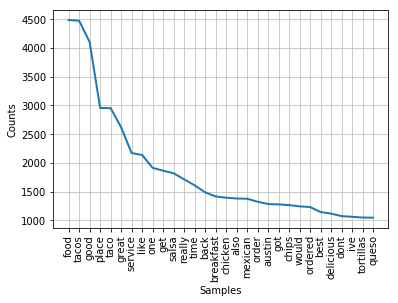

In [91]:
%matplotlib inline

count = nltk.FreqDist(a)
count.plot(30)

In [92]:
####the below code will take alot of time...!!

In [93]:
df_word = pd.DataFrame(columns=['Word','Frequency'])
a=0
b=0
for j in count.keys():
    df_word.loc[a, ['Word']] = j
    a=a+1
for k in count.values():
    df_word.loc[b,['Frequency']] = k
    b=b+1
x = df_word.sort_values(by=['Frequency'],ascending = False)
x

,Word,Frequency
26,food,4484
131,tacos,4471
25,good,4100
43,place,2954
8,taco,2952
3,great,2617
338,service,2171
42,like,2138
105,one,1914
46,get,1864


In [94]:
x.to_csv('word_count.csv', sep=',',encoding='utf-8')

In [95]:
df_word_count=pd.read_csv('word_count.csv')
df_word_count=df_word_count.drop(columns=['Unnamed: 0'],axis=1)
df_word_count.head()


,Word,Frequency
0,food,4484
1,tacos,4471
2,good,4100
3,place,2954
4,taco,2952


## Summary till this point:

Here, in order to actually proceed for task 2, we required few initial steps namely:

* Preprocessing: remove punctutions and stop words
* Calculating frequency of words as appeared in the reviews.
* As expected, here also we found that the few words occured many times while the frequency of other words dropped drastically. This helped us in moving ahead with the next step where we actually have to replace the words with different attributes.


##### Main Steps

In [4]:
df_attributes=pd.read_csv('attributes_added_new.csv',encoding = "ISO-8859-1")
df_attributes=df_attributes.drop(columns=['Unnamed: 0'],axis=1)
df_attributes

,Word,Frequency,attribute
0,food,4484,food
1,tacos,4471,food
2,good,4100,food
3,place,2954,location
4,taco,2952,food
5,great,2617,service
6,service,2171,service
7,like,2138,food
8,one,1914,NaN
9,get,1864,NaN


In [97]:
service=[]
food=[]
price=[]
location=[]

for x in range(len(df_attributes)):
    if df_attributes.loc[x]['attribute']=='food':
        food.append(df_attributes.loc[x]['Word'])
    elif df_attributes.loc[x]['attribute']=='service':
        service.append(df_attributes.loc[x]['Word'])
    elif df_attributes.loc[x]['attribute']=='location':
        location.append(df_attributes.loc[x]['Word'])
    elif df_attributes.loc[x]['attribute']=='price':
        price.append(df_attributes.loc[x]['Word'])
    

In [98]:
dict_names = {}

dict_names.update( {'service' : service})
dict_names.update( {'food' : food})
dict_names.update( {'price' : price})
dict_names.update( {'location' : location})



In [99]:
for x in dict_names.items():
    print(x)

('service', ['great', 'service', 'time', 'order', 'ordered', 'well', 'menu', 'friendly', 'better', 'wait', 'staff', 'table', 'minutes', 'experience', 'hour', 'stars', 'awesome', 'waitress', 'quick', 'authentic', 'top', 'fast', 'served', 'star', 'manager', 'tables', 'review', 'customer', 'okay', 'clean', 'enjoyed', 'reviews', 'enjoy', 'look', 'line', 'orders', 'attentive', 'fan', 'seated', 'business', 'bring', 'slow', 'liked', 'waiting', 'dining', 'quickly', 'waited', 'regular', 'customers', 'hours', 'kitchen', 'impressed', 'helpful', 'working', 'servers', 'bartender', 'hostess'])
('food', ['food', 'tacos', 'good', 'taco', 'like', 'salsa', 'breakfast', 'chicken', 'mexican', 'chips', 'best', 'delicious', 'tortillas', 'cheese', 'fresh', 'nice', 'little', 'love', 'lunch', 'sauce', 'beans', 'eat', 'flavor', 'amazing', 'drinks', 'rice', 'favorite', 'beef', 'meat', 'bad', 'happy', 'tortilla', 'texmex', 'tasty', 'super', 'hot', 'meal', 'taste', 'margaritas', 'drink', 'fajitas', 'dinner', 'exce

## Summary till this point:

The requirement of this task was to create a list of words for each of the four attributes: Service, Food, Location, Price. To achieve this task we did the following:

* From the word frequenct count we selected the words for each of these attributes.
* Here it is important to note that although words with higher frequency are important but at the same time it is important to keep in mind that words that appear everywhere are useless.

#### Important analysis:

* Since we are scrapping a food/restaurant website it was expected that the words related to food will be the maximum and appeared through are results. 
* It is of critical importance to select the right word in Food attribute because if we will put every word that is related to food under 'food' attribute, then if will make two reviews quite similar to each other w.r.t to 'food' attribute. Also, it will affect the overall accuracy of our model.
* We also found that the words under attribute Price are pretty less-- this implies either of two things:
   * Either people are refering to same words when they talk about price, again and again, which is a good thing.
   * Or people are not talking much about the price, which we think is not a great thing.

To see what is actually the case we proceed with further analysis

## Task C

From a word frequency analysis of the reviews, do word replacements as deemed suitable – e.g., replace fast, friendly, etc. with service; variety, taste, choice, taco, etc. with food; etc.


In [100]:
df_temp=df_final

In [101]:
for x in dict_names.items():
    for y in x[1]:
        df_temp['reviews_final']  = df_temp['reviews_final'].str.replace(str(y) , str(x[0]))

In [102]:
df_temp.head()

,restaurant_links,Ratings,reviews_final
0,La Traila at Mesa,5.0,oh foodness say wow service depth food wanted ...
1,Serranos,4.0,service pfoods food food said someone randomly...
2,Fruteria Pekitas,4.0,fruit food food many service combinations allo...
3,Tacos El Rincon,5.0,hey el ricon location location pig teeth food ...
4,Zuzu Handmade Mexican Food,1.0,servicet services dirty wiped regretted leavin...


# Task D

Perform a cosine similarity analysis between the attribute set (service, food, price and location) and the reviews. It is like running a document query with words = service, food, price and location, and finding documents which are the best matches for the query words. Choose 200 reviews that have the highest cosine similarity scores. Cosine similarity is available in scikit-learn in Python.


In [103]:
# Finding Cosine similarity
#doc = df_temp['reviews_final']
value = ("Food Price Service Location")
df_temp.loc[-1] = [2,3,value]  # adding a row
df_temp.index = df_temp.index + 1  # shifting index
df_temp = df_temp.sort_index()
#df_temp['reviews_final'].iloc[0]=value
df_temp.head()

,restaurant_links,Ratings,reviews_final
0,2,3,Food Price Service Location
1,La Traila at Mesa,5.0,oh foodness say wow service depth food wanted ...
2,Serranos,4.0,service pfoods food food said someone randomly...
3,Fruteria Pekitas,4.0,fruit food food many service combinations allo...
4,Tacos El Rincon,5.0,hey el ricon location location pig teeth food ...


In [104]:
final_doc = df_temp['reviews_final']
all_documents = tuple(final_doc)


In [105]:
print(type(all_documents))

<class 'tuple'>


In [106]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(all_documents)
print (tfidf_matrix.shape)
print(tfidf_matrix)


(6736, 16721)
  (0, 5791)	0.3444536349641252
  (0, 11498)	0.749877917719998
  (0, 13123)	0.3864062662347004
  (0, 8687)	0.41197694024117276
  (1, 5791)	0.2199434223911094
  (1, 11498)	0.07980305564977447
  (1, 13123)	0.041121894696549234
  (1, 8687)	0.04384316154881933
  (1, 10330)	0.15799708615879327
  (1, 6036)	0.1842364579411514
  (1, 12870)	0.1280206766147061
  (1, 16523)	0.18653505980785545
  (1, 4146)	0.28060482767193984
  (1, 16146)	0.15309567446783007
  (1, 3187)	0.11448014153282404
  (1, 8359)	0.3510230738667054
  (1, 15340)	0.6114946201483231
  (1, 4098)	0.21341342054017015
  (1, 10825)	0.13395149313670793
  (1, 1984)	0.2004047198341243
  (1, 14081)	0.1367621919985044
  (1, 4052)	0.11438725304498822
  (1, 3200)	0.1467983442003449
  (1, 1492)	0.09037544716296446
  (1, 11012)	0.13459350874065076
  :	:
  (6734, 6154)	0.26377082790472794
  (6734, 12211)	0.21775363334280753
  (6734, 16537)	0.23616414976631048
  (6734, 5509)	0.2019854935333834
  (6734, 10926)	0.22227525184394972
  

In [107]:
from sklearn.metrics.pairwise import cosine_similarity
val = cosine_similarity(tfidf_matrix[0:1], tfidf_matrix)
final_val= val.reshape(6736,)

In [108]:
df_temp['reviews_final'].shape

(6736,)

In [109]:
df_temp['Cosine Similarity'] = final_val
df_temp.head()

,restaurant_links,Ratings,reviews_final,Cosine Similarity
0,2,3,Food Price Service Location,1.000000
1,La Traila at Mesa,5.0,oh foodness say wow service depth food wanted ...,0.169555
2,Serranos,4.0,service pfoods food food said someone randomly...,0.183429
3,Fruteria Pekitas,4.0,fruit food food many service combinations allo...,0.271721
4,Tacos El Rincon,5.0,hey el ricon location location pig teeth food ...,0.073332


In [110]:
df_sorted=df_temp.sort_values(by=['Cosine Similarity'],ascending=False)

In [111]:
df_sorted.head()

,restaurant_links,Ratings,reviews_final,Cosine Similarity
0,2,3,Food Price Service Location,1.000000
6483,Cyclone Anaya’s Tex-Mex Cantina,5.0,went location today food service first service...,0.700581
6172,El Rinconcito Del Sabor,5.0,price food food food food,0.661017
5572,Tacos Guerrero,5.0,food food food price food,0.661017
5086,Tacaso El Amigo,5.0,food breakservice food food food foods service...,0.603447


In [112]:
df_temp1=df_sorted.iloc[1:,:]
df_top200 = df_temp1.head(200)

In [113]:
df_top200

,restaurant_links,Ratings,reviews_final,Cosine Similarity
6483,Cyclone Anaya’s Tex-Mex Cantina,5.0,went location today food service first service...,0.700581
6172,El Rinconcito Del Sabor,5.0,price food food food food,0.661017
5572,Tacos Guerrero,5.0,food food food price food,0.661017
5086,Tacaso El Amigo,5.0,food breakservice food food food foods service...,0.603447
2674,Granny’s Tacos,5.0,food foodd food location took food service ser...,0.597221
651,Los Comales Mexican Restaurant,5.0,food servicedo location location one service l...,0.588589
924,JD’s Tacos,4.0,service breakservice food food service service...,0.585977
267,Jefes,4.0,food location food service food food service f...,0.578514
5288,La Michoacana Meat Market,5.0,service food price price register food food pr...,0.576502
1361,Javi’s Best of Tex-Mex,4.0,food food typical food service food service se...,0.556835


## Summary till this point:

The requirement of this task was:
* replace the words in the reviews with their respective attributes
* find cosine similarity and sort the dataframe in descending order as per cosine similarity
* Find top 200 reviews with highest Cosine similarity

To understand this task better it is important to understand the significance of Cosine Similarity


#### What does Cosine Similarity implies and what is the significance of high values?

We placed the first row of review_text column as "Location Price Service Food" and we found the cosine similarity with respect to each review . The cosine similarity tells us how similar the two sentences are therefore high cosine similarity tells us the reviews which talks most about the user defined attributes and when combined with sentiment analysis gives us the best recommendation for user.


## Task E

Perform sentiment analysis on these 200 reviews and sort them (high to low) by the sentiment scores.


In [114]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

def sentiment_analyzer_scores(sentence):
    score = analyzer.polarity_scores(sentence)
    return score['compound']

In [115]:
score_dic = []

for i in df_top200['reviews_final']:
    counter = 0
    score = 0
    counter += 1
    score += sentiment_analyzer_scores(i)
    score_dic.append(score)
   # if i> 1


In [152]:
df_top200['sentiment'] = score_dic
df_temp = df_top200
df_temp=df_temp.sort_values(by=['sentiment'], ascending=False)
df_temp
df_top200=df_temp

df_top200

,restaurant_links,Ratings,reviews_final,Cosine Similarity,sentiment
3480,Jalisco’s Restaurant and Bar,4.0,service pertains breakservice food specificall...,0.372808,0.9934
541,El Nuevo Mexico- Austin,5.0,location overall service purchased locationon ...,0.379487,0.9174
3955,Taqueria La Tapatia,5.0,food location food food food food food massive...,0.381424,0.9022
1060,Flores Mexican Restaurant,4.0,service location location food food food food ...,0.380101,0.8913
6154,Jefes,5.0,youre serviceing service food food service loc...,0.455836,0.8910
1451,El Nuevo Mexico- Austin,4.0,food el nuevo location runs service allocation...,0.368644,0.8720
6483,Cyclone Anaya’s Tex-Mex Cantina,5.0,went location today food service first service...,0.700581,0.8629
2988,Javi’s Best of Tex-Mex,5.0,food food location within locationeast locatio...,0.379704,0.8625
5069,La Feria Mexican Restaurant,4.0,difficult rate location service isa service lo...,0.367981,0.8456
5132,Maudie’s Milagro,4.0,wife food location service food service usuall...,0.410802,0.8402


## Task E & Task F

# FInding the average Rating, Sentiment Score and Cosine Similarity for each restaurant
1. The restaurant were grouped by together and we applied aggreagate function(np.mean) to calulate the average for each mentioned functionality


In [140]:
a = df_top200.groupby('restaurant_links')

In [141]:
df_top200['Ratings'] = pd.to_numeric(df_top200['Ratings'])

In [142]:
df_new = pd.DataFrame()
# df_new['Restaurants'] = a['restaurant_links']

In [143]:
df_new = pd.DataFrame(a['Ratings'].agg(np.mean))

In [144]:
df_new.reset_index(inplace=True)
df_new['Ratings'].head(5)

0    3.666667
1    5.000000
2    5.000000
3    4.285714
4    4.000000
Name: Ratings, dtype: float64

# Finding mean of sentiment score for restaurants

In [145]:
sen = pd.DataFrame(a['sentiment'].agg(np.mean))
sen.reset_index(inplace = True)
df_new['avg sentiment'] = sen['sentiment']

# finding mean for Cosine similarity for restaurants

In [146]:
cos = pd.DataFrame(a['Cosine Similarity'].agg(np.mean))
cos.reset_index(inplace = True)
df_new['avg Cosine Similarity'] = cos['Cosine Similarity']

In [153]:
df_new.head(5)

,restaurant_links,Ratings,avg sentiment,avg Cosine Similarity
0,Angie’s Mexican Restaurant,3.666667,0.017200,0.408260
1,Chetos Tacos,5.000000,0.272700,0.387015
2,Chupacabra Cantina Y Tacqueria,5.000000,0.616600,0.395618
3,Cyclone Anaya’s Tex-Mex Cantina,4.285714,0.208143,0.434978
4,Don Juan,4.000000,0.000000,0.373110


In [176]:
recommend_Movies_ratings = pd.DataFrame()
recommend_Movies_ratings = df_new.sort_values('Ratings', ascending=False)

## Recommended Movies as per avg. Ratings

In [177]:
recommend_Movies_ratings.head()

,restaurant_links,Ratings,avg sentiment,avg Cosine Similarity
47,Taqueria La Tapatia,5.0,0.1695,0.381424
14,Hecho En Mexico,5.0,0.0000,0.431881
2,Chupacabra Cantina Y Tacqueria,5.0,0.6166,0.395618
30,Matamoros Tacos,5.0,0.0000,0.383066
53,Velvet Taco,5.0,0.2553,0.407516


# Top 3 Restaurants as per Ratings are:

1. Taqueria La Tapatia
2. Hecho En Mexico
3. 	Chupacabra Cantina Y Tacqueria

## Recommended Movies as per Cosine Similarity and Avg. Sentiment

In [171]:
movies_cos_sentiment = pd.DataFrame()
movies_cos_sentiment = df_new.sort_values(['avg Cosine Similarity'], ascending=False)
movies_cos_sentiment = movies_cos_sentiment.sort_values(['avg sentiment'], ascending=False)


In [172]:
movies_cos_sentiment.head()

,restaurant_links,Ratings,avg sentiment,avg Cosine Similarity
23,La Traila at Mesa,5.0,0.7351,0.382205
9,Flavia’s Kitchen,4.0,0.6597,0.376298
24,Las Perlas,4.0,0.6369,0.385795
2,Chupacabra Cantina Y Tacqueria,5.0,0.6166,0.395618
37,Rico’s Tacos,5.0,0.5267,0.414744


# Top 3 Restaurants as per Cosine Similarity and Sentimental Analysis are:

1. La Traila at Mesa
2. Flavia’s Kitchen
3. Las Perlas

# Inferences

Here the following inferences are observed:

#### Inference 1:
The restaurants recommended on the basis of ratings and Sentiment & Cosine Similarity are completely different. There is not even a single restaurant that is matching.

##### What does this indicate?
It indicates that using avg. rating as the sole method for recommendation may not be absolutely correct. This is mainly because this method does not take into account the user sentiments. It is entirely possible that the restaurant has high ratings because of some other attributes than the user is looking for. This is also evident from the recommendations of avg. rating. Although the rating is 5.0 the sentiment score is very low or even 0 which shows that the these restaurants are not that good in people's conversation. The sentiment of 0.0. also indicates that people are either neutral about the restaurant or the restaurant has too positive or too negative sentiments, which eventually cancels out each other.

#### Inference 2:
Restaurants recommendation based on cosine similarity and sentiment analysis high sentiment values which is a good thing while near average avg. Cosine Similarity.

##### What does this indicate?
This indicates that these restaurant have positive vibes among the users. Also, in terms of attributes as requested by the user, these restaurant seems to be fine. This shows that if we use this method to recommend the restaurants then we are more likely to recommend better restaurants to user. Also, it is the avg. cosine similarity and not the individual cosine similarity of the review so even if the value is not that high it should not make that difference

Around 7000 reviews used